# [📖 Main Menu](index.html)

In [1]:
using StatsBase, DataFrames, DataFrameMacros
using RCall, CategoricalArrays, TexTables
using Distributions, Gadfly, Compose, MLJ
using Effects, StandardizedPredictors
using GLM, MLJGLMInterface, StableRNGs
import AnovaGLM as aov
using MLJ: schema

In [2]:
include("pubh.jl")
set_default_plot_size(15cm, 12cm)
@rlibrary readr
@rimport pubh

In [3]:
#| output: false
R"""
library(pubh)
library(sjlabelled)
""";

┌ Warning: RCall.jl: Loading required package: emmeans
│ Loading required package: ggformula
│ Loading required package: ggplot2
│ Loading required package: scales
│ Loading required package: ggridges
│ 
│ New to ggformula?  Try the tutorials: 
│ 	learnr::run_tutorial("introduction", package = "ggformula")
│ 	learnr::run_tutorial("refining", package = "ggformula")
│ Loading required package: gtsummary
│ #Uighur
│ Loading required package: huxtable
│ 
│ Attaching package: ‘huxtable’
│ 
│ The following object is masked from ‘package:gtsummary’:
│ 
│     as_flextable
│ 
│ The following object is masked from ‘package:scales’:
│ 
│     number_format
│ 
│ The following object is masked from ‘package:ggplot2’:
│ 
│     theme_grey
│ 
│ Loading required package: magrittr
└ @ RCall ~/.julia/packages/RCall/dDAVd/src/io.jl:172
┌ Warning: RCall.jl: 
│ Attaching package: ‘sjlabelled’
│ 
│ The following object is masked from ‘package:huxtable’:
│ 
│     set_label
│ 
│ The following object is masked f

# Introduction

## Initial data manipulation

In [4]:
R"""
data(births, package = "Epi")
""";

In [5]:
@rget births
births |> dropmissing!
births |> schema

┌─────────┬────────────┬─────────┐
│ names   │ scitypes   │ types   │
├─────────┼────────────┼─────────┤
│ id      │ Continuous │ Float64 │
│ bweight │ Continuous │ Float64 │
│ lowbw   │ Continuous │ Float64 │
│ gestwks │ Continuous │ Float64 │
│ preterm │ Continuous │ Float64 │
│ matage  │ Continuous │ Float64 │
│ hyp     │ Continuous │ Float64 │
│ sex     │ Continuous │ Float64 │
└─────────┴────────────┴─────────┘


In this tutorial, we have a first look at machine learning with `MLJ`. `MLJ` requires that all our variables are of scitype `Continuous`. For convenience, I will transform categorical variables in `R` and save it as a different data frame.

In [6]:
R"""
births2 = births %>%
  mutate(
    low = factor(lowbw, labels=c('No', 'Yes')),
    preterm = factor(preterm, labels=c('No', 'Yes')),
    hyp = factor(hyp, labels=c('No hypertension', 'Hypertension')),
    sex = factor(sex, labels=c('Male', 'Female'))
  ) %>%
  na.omit() %>%
  var_labels(
    bweight = "Birth weight (g)",
    low = "Birth weight < 2.5 kg?",
    gestwks = "Gestation period (weeks)",
    preterm = "Gestation period < 37 weeks?",
    matage = "Maternal age (years)",
    hyp = "Maternal hypertension",
    sex = "Sex"
  )
""";

In [7]:
@rget births2
DataFrames.rename!(
	births2,
	:gestwks => :Gestation,
	:matage => :Age,
	:hyp => :Hypertension,
	:sex => :Sex
);

## Descriptive statistics

Let's start by looking at the table of descriptive statistics.

In [8]:
#| output: asis
R"""
births2 %>%
select(-c(id, lowbw)) %>%
tbl_summary() %>% 
cosm_sum(bold=TRUE) %>% theme_pubh() %>% 
set_caption("Descriptive statistics of singleton births in a London Hospital.") %>%
print_html()
""";

<table class="huxtable" data-quarto-disable-processing="true" style="border-collapse: collapse; border: 0px; margin-bottom: 2em; margin-top: 2em; ; margin-left: auto; margin-right: auto;  ">
<caption style="caption-side: top; text-align: center;">Descriptive statistics of singleton births in a London Hospital.</caption><col><col><tr>
<th style="vertical-align: top; text-align: left; white-space: normal; border-style: solid solid solid solid; border-width: 0.4pt 0pt 0.4pt 0pt;    padding: 3pt 6pt 3pt 6pt; font-weight: bold;"><p><strong>Variable</strong></p>
</th><th style="vertical-align: top; text-align: right; white-space: normal; border-style: solid solid solid solid; border-width: 0.4pt 0pt 0.4pt 0pt;    padding: 3pt 6pt 3pt 6pt; font-weight: bold;"><p><strong>N = 490</strong></p>
</th></tr>
<tr>
<td style="vertical-align: top; text-align: left; white-space: normal; border-style: solid solid solid solid; border-width: 0.4pt 0pt 0pt 0pt;    padding: 3pt 6pt 3pt 6pt; font-weight: bold

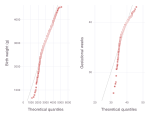

In [9]:
#| label: fig-fig1
#| fig-cap: "QQ-plots against the standard Normal distribution."
#| code-fold: true
let
	p1 = qq_plot(births.bweight, ylab = "Birth weight (g)")
	p2 = qq_plot(births.gestwks, ylab = "Gestational weeks")
		
	hstack(p1, p2)
end

## Linearity

Let's graphically check if there is a linear relationship between gestation time and birth weight.

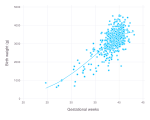

In [10]:
#| label: fig-fig2
#| fig-cap: "Relationship between gestation time and birth weight from the births dataset. The curve represents a loess fit."
plot(
	births,
	x = :gestwks,
	y = :bweight,
	Geom.point(), Geom.smooth(smoothing = 0.9),
	Guide.xlabel("Gestational weeks"),
	Guide.ylabel("Birth weight (g)")
)

Let's construct the plot for the section where linearity is more evident.

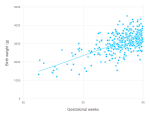

In [11]:
#| label: fig-fig3
#| fig-cap: "Relationship between gestation time (restricted between 31 and 40 weeks) and birth weight from the data births. The black curve represents a loess fit."
plot(
	@subset(births, :gestwks > 31, :gestwks < 40),
	x = :gestwks,
	y = :bweight,
	Geom.point(), Geom.smooth(smoothing = 0.9),
	Guide.xlabel("Gestational weeks"),
	Guide.ylabel("Birth weight (g)")
)

Let's generate a new dataset with the subset of observations that are within the linear section of the relationship between gestation period and birth weight. For this subset, we will select only variables of interest.

In [12]:
births |> names

8-element Vector{String}:
 "id"
 "bweight"
 "lowbw"
 "gestwks"
 "preterm"
 "matage"
 "hyp"
 "sex"

In [13]:
babies = @select(
  @subset(births, :gestwks .> 31, :gestwks .< 40),
  {Not([:id, :preterm, :lowbw])}
)

rename!(
  babies,
  :gestwks => :Gestation,
  :matage => :Age,
  :hyp => :Hypertension,
  :sex => :Sex
)
babies |> head

Row,bweight,Gestation,Age,Hypertension,Sex
,Float64,Float64,Float64,Float64,Float64
1,2974.0,38.52,34.0,0.0,2.0
2,2620.0,38.15,35.0,0.0,2.0
3,3751.0,39.8,31.0,0.0,1.0
4,3200.0,38.89,33.0,1.0,1.0
5,3405.0,39.33,39.0,0.0,1.0


In [14]:
babies_cat = @select(
  @subset(births2, :Gestation .> 31, :Gestation .< 40),
  {Not([:id, :lowbw, :preterm, :low])}
)

babies_cat |> head

Row,bweight,Gestation,Age,Hypertension,Sex
,Float64,Float64,Float64,Cat…,Cat…
1,2974.0,38.52,34.0,No hypertension,Female
2,2620.0,38.15,35.0,No hypertension,Female
3,3751.0,39.8,31.0,No hypertension,Male
4,3200.0,38.89,33.0,Hypertension,Male
5,3405.0,39.33,39.0,No hypertension,Male


## Interactions

We will check for potential interactions graphically. Let's start with sex.

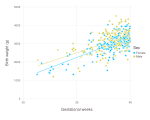

In [15]:
#| label: fig-fig4
#| fig-cap: "Relationship between gestation time and birth weight by sex. Curves represent fitted linear regressions by sex."
plot(
	babies_cat,
	x = :Gestation,
	y = :bweight,
	color = :Sex,
	Geom.point, Geom.smooth(method = :lm),
	Guide.xlabel("Gestational weeks"),
	Guide.ylabel("Birth weight (g)")
)

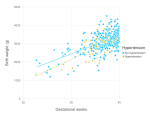

In [16]:
#| label: fig-fig5
#| fig-cap: "Relationship between gestation time and birth weight by hypertension status. Curves represent fitted linear regressions by maternal hypertension."
#| code-fold: true
plot(
	babies_cat,
	x = :Gestation,
	y = :bweight,
	color = :Hypertension,
	Geom.point, Geom.smooth(method = :lm),
	Guide.xlabel("Gestational weeks"),
	Guide.ylabel("Birth weight (g)")
)

# GLM Approach

## Model simplification

We can start model simplification using ANOVA.

In [17]:
model_1 = lm(
	@formula(bweight ~ Gestation + Age + Hypertension + Sex),
	births2
)

aov.anova(model_1; type=3)

Analysis of Variance

Type 3 test / F test

bweight ~ 1 + Gestation + Age + Hypertension + Sex

Table:
───────────────────────────────────────────────────────────────
              DOF       Exp.SS  Mean Square   F value  Pr(>|F|)
───────────────────────────────────────────────────────────────
(Intercept)     1  21680318.92  21680318.92  113.3498    <1e-23
Gestation       1  91012707.58  91012707.58  475.8360    <1e-73
Age             1     24612.93     24612.93    0.1287    0.7200
Hypertension    1   1519231.86   1519231.86    7.9429    0.0050
Sex             1   4734298.72   4734298.72   24.7520    <1e-06
(Residuals)   485  92765500.86    191269.07              
───────────────────────────────────────────────────────────────



Let's remove `Age` from the model and define our contrasts for the categorical variables.

In [18]:
bw_cont = Dict(
	:Hypertension => EffectsCoding(),
	:Sex => EffectsCoding()
);

In [19]:
model_2 = lm(
	@formula(bweight ~ Gestation + Hypertension + Sex),
	births2,
	contrasts = bw_cont
)

aov.anova(model_2; type=3)

Analysis of Variance

Type 3 test / F test

bweight ~ 1 + Gestation + Hypertension + Sex

Table:
───────────────────────────────────────────────────────────────
              DOF       Exp.SS  Mean Square   F value  Pr(>|F|)
───────────────────────────────────────────────────────────────
(Intercept)     1  31652620.83  31652620.83  165.7846    <1e-32
Gestation       1  90992572.27  90992572.27  476.5851    <1e-73
Hypertension    1   1500405.49   1500405.49    7.8586    0.0053
Sex             1   4714027.66   4714027.66   24.6903    <1e-06
(Residuals)   486  92790113.78    190926.16              
───────────────────────────────────────────────────────────────



In [20]:
glm_coef(model_2 |> coeftable |> DataFrame, ratio=false)

Row,Name,Coef.,Lower 95%,Upper 95%,Pr(>|t|)
,String,Float64,Float64,Float64,Float64
1,(Intercept),-4319.76,-4978.97,-3660.56,0.0
2,Gestation,191.005,173.814,208.196,0.0
3,Hypertension: Hypertension,-80.664,-137.202,-24.126,0.005
4,Sex: Female,-98.382,-137.285,-59.479,0.0


# MLJ Continuous variables

## Response and predictors

Our first model will contain all relevant predictors with no interaction terms. We can use `unpack` to define *response* and *explanatory* variables.

In [21]:
@select!(babies, :bweight, :Gestation, :Hypertension, :Sex)
babies |> head

Row,bweight,Gestation,Hypertension,Sex
,Float64,Float64,Float64,Float64
1,2974.0,38.52,0.0,2.0
2,2620.0,38.15,0.0,2.0
3,3751.0,39.8,0.0,1.0
4,3200.0,38.89,1.0,1.0
5,3405.0,39.33,0.0,1.0


In [22]:
y1, x1 = unpack(babies, ==(:bweight))
x1 |> head

Row,Gestation,Hypertension,Sex
,Float64,Float64,Float64
1,38.52,0.0,2.0
2,38.15,0.0,2.0
3,39.8,0.0,1.0
4,38.89,1.0,1.0
5,39.33,0.0,1.0


## Data splitting

We will split the data, in particular, the outcome (response) in two:

- *train* : 70 % of the data
- *test* : 30 % of the data

In [23]:
using StableRNGs
rng = StableRNG(566)
train, test = partition(eachindex(y1), 0.7, shuffle=true, rng=rng);

## Model

In [24]:
LinearRegressor = @load LinearRegressor pkg=GLM verbosity=0
glm = LinearRegressor()

LinearRegressor(
  fit_intercept = true, 
  dropcollinear = false, 
  offsetcol = nothing, 
  report_keys = [:deviance, :dof_residual, :stderror, :vcov, :coef_table])

In [25]:
bw_mach = machine(glm, x1, y1)
fit!(bw_mach, rows=train);

[ Info: Training machine(LinearRegressor(fit_intercept = true, …), …).


In [26]:
glm_coef(report(bw_mach).coef_table |> DataFrame, ratio=false)

Row,Name,Coef.,Lower 95%,Upper 95%,Pr(>|t|)
,String,Float64,Float64,Float64,Float64
1,Gestation,201.745,168.36,235.131,0.0
2,Hypertension,-164.132,-320.005,-8.26,0.039
3,Sex,-177.601,-292.207,-62.996,0.003
4,(Intercept),-4374.53,-5669.29,-3079.76,0.0


# MLJ Categorical variables

In the previous section, we used a continuous version for all predictors. Let's see what happens when we work with the categorical, original versions of the predictors.

## One Hot Encoding (OHE)

One hot encoding is a process of converting categorical variables to form multiple numerical columns as there are categories. This is done so that the variables can be fed into ML algorithms to do a better job in prediction.

As before, first, we unpack data into response (outcome) and explanatory (exposure/predictor) variables.

In [27]:
@select!(babies_cat, :bweight, :Gestation, :Hypertension, :Sex)
y2, x2 = unpack(babies_cat, ==(:bweight))
x2 |> head

Row,Gestation,Hypertension,Sex
,Float64,Cat…,Cat…
1,38.52,No hypertension,Female
2,38.15,No hypertension,Female
3,39.8,No hypertension,Male
4,38.89,Hypertension,Male
5,39.33,No hypertension,Male


In [28]:
babies_cat |> schema

┌──────────────┬───────────────┬──────────────────────────────────┐
│ names        │ scitypes      │ types                            │
├──────────────┼───────────────┼──────────────────────────────────┤
│ bweight      │ Continuous    │ Float64                          │
│ Gestation    │ Continuous    │ Float64                          │
│ Hypertension │ Multiclass{2} │ CategoricalValue{String, UInt32} │
│ Sex          │ Multiclass{2} │ CategoricalValue{String, UInt32} │
└──────────────┴───────────────┴──────────────────────────────────┘


## Model

In `OneHotEncoder`, all categorical variables are included by default (features argument). We want to drop one of the levels to use as a reference, we achieve this with the argument `drop_last=true`. We are going to include the `OneHotEncoder` as part of a pipe line. 

`ContinuousEncoder` converts all categorical variables to continuous ones, creating new variables for the levels and makes sure that all numerical variables are indeed continuous ones. Instead of centring, we will use a scaler, one that standardises numerical variables.

In [29]:
pipe = 	ContinuousEncoder(drop_last=true) |> Standardizer()  |> glm

ProbabilisticPipeline(
  continuous_encoder = ContinuousEncoder(
        drop_last = true, 
        one_hot_ordered_factors = false), 
  standardizer = Standardizer(
        features = Symbol[], 
        ignore = false, 
        ordered_factor = false, 
        count = false), 
  linear_regressor = LinearRegressor(
        fit_intercept = true, 
        dropcollinear = false, 
        offsetcol = nothing, 
        report_keys = [:deviance, :dof_residual, :stderror, :vcov, :coef_table]), 
  cache = true)

In [30]:
levels!(x2.Hypertension, ["Hypertension", "No hypertension"])
levels!(x2.Sex, ["Female", "Male"]);

In [31]:
mach = machine(pipe, x2, y2)

untrained Machine; does not cache data
  model: ProbabilisticPipeline(continuous_encoder = ContinuousEncoder(drop_last = true, …), …)
  args: 
    1:	Source @211 ⏎ Table{Union{AbstractVector{ScientificTypesBase.Continuous}, AbstractVector{Multiclass{2}}}}
    2:	Source @314 ⏎ AbstractVector{ScientificTypesBase.Continuous}


In [32]:
fit!(mach, rows=train)
glm_coef(
  report(mach).linear_regressor.coef_table |> DataFrame,
  ratio=false
)

[ Info: Training machine(ProbabilisticPipeline(continuous_encoder = ContinuousEncoder(drop_last = true, …), …), …).
[ Info: Training machine(:continuous_encoder, …).
[ Info: Training machine(:standardizer, …).
[ Info: Training machine(:linear_regressor, …).


Row,Name,Coef.,Lower 95%,Upper 95%,Pr(>|t|)
,String,Float64,Float64,Float64,Float64
1,Gestation,347.848,290.285,405.412,0.0
2,Hypertension__Hypertension,-60.574,-118.1,-3.048,0.039
3,Sex__Female,-88.856,-146.195,-31.517,0.003
4,(Intercept),3023.65,2966.53,3080.77,0.0


We can compare the coefficients against those from the GLM approach:

In [33]:
glm_coef(model_2 |> coeftable |> DataFrame, ratio=false)

Row,Name,Coef.,Lower 95%,Upper 95%,Pr(>|t|)
,String,Float64,Float64,Float64,Float64
1,(Intercept),-4319.76,-4978.97,-3660.56,0.0
2,Gestation,191.005,173.814,208.196,0.0
3,Hypertension: Hypertension,-80.664,-137.202,-24.126,0.005
4,Sex: Female,-98.382,-137.285,-59.479,0.0


# Diagnostics

## Normality

In [34]:
bw_perf = model_perf(model_2);

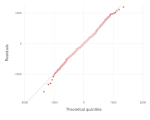

In [35]:
#| label: fig-fig6
#| fig-cap: "QQ-Plot of the residuals from the GLM model predicting birth weight."
resid_plot(bw_perf)

## Homoscedasticity

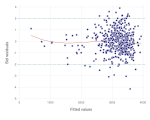

In [36]:
#| label: fig-fig7
#| fig-cap: "Residuals vs Fitted plot."
rvf_plot(bw_perf)

## Influential observations

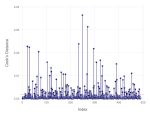

In [37]:
#| label: fig-fig8
#| fig-cap: "Cook's distance for each oservation (index)."
cooks_plot(bw_perf)

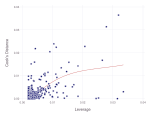

In [38]:
#| label: fig-fig9
#| fig-cap: "Cook's Distance vs Leverage."
cook_lev_plot(bw_perf)

### Collinearity

When more than two variables are involved, it is often called multicollinearity. However, the terms collinearity and multicollinearity are often used interchangeably. The variance inflation factor (VIF) is used to test for collinearity. The rule of thumb is:

- Values larger than 10 give evidence of collinearity.
- A mean of the VIF factors considerably greater than 1 suggests collinearity.

In [39]:
using MixedModelsExtras: gvif

In [40]:
r3.(gvif(model_2))

3-element Vector{Float64}:
 1.05
 1.053
 1.004

The results from gvif follow the same order as the coefficients of the model, this is:

- Gestational weeks.
- Hypertension.
- Sex.

# Effect Plots

We can plot all the predictors who have an effect on birth weight.

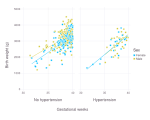

In [41]:
#| label: fig-fig10
#| fig-cap: "Effect of number of gestational weeks on birth weights of the babies, adjusted by sex and hypertension."
plot(
  babies_cat,
  x=:Gestation, y=:bweight,
  color=:Sex, xgroup=:Hypertension,
  Geom.subplot_grid(Geom.point, Geom.smooth(method=:lm)),
  Guide.xlabel("Gestational weeks"),
  Guide.ylabel("Birth weight (g)")
)

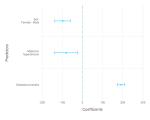

In [42]:
#| label: fig-fig11
#| fig-cap: "Coefficient plot for model predicting birth weight in babies."
coef_plot(
	model_2,
	[
		"Gestational weeks",
		"Maternal \n hypertension",
		"Sex \n Female - Male"
	]
)

# Performance

## Full data set

In [43]:
r2(model_2) |> r3

0.537

In [44]:
adjr2(model_2) |> r3

0.534

In [45]:
mape(bw_perf) |> r3

0.0

In [46]:
rmse(bw_perf) |> r3

435.164

## Test data set

In [47]:
ŷ = MLJ.predict(mach, rows=test)
ȳ = predict_mode(mach, rows=test);

In [48]:
cross_entropy(ŷ, y2[test]) |> mean |> r3

7.466

In [49]:
coef_det(ȳ, y2[test]) |> r3

0.403